# **3rd Assignment**
Dec 6, 2022

# Exercise 3: **Transfer Learning**

### Loading dataset

In [ ]:
import cv2
import os
import pandas as pd
import torch
import time
from torch import nn
import torch.nn.functional as F
import torchvision
from torchvision import datasets, models
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor,Normalize, RandomHorizontalFlip, Resize
from torch.utils.data import DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
from torch.autograd import Variable
from PIL import Image
import numpy as np
from glob import glob
import os
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
train_path = '../input/intel-image-classification/seg_train/seg_train'
test_path = '../input/intel-image-classification/seg_test/seg_test'
pred_path = '../input/intel-image-classification/seg_pred/seg_pred'

In [ ]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


In [ ]:
train_transforms = transforms.Compose([transforms.Resize((150,150)),
                                      transforms.ColorJitter(brightness=(0.5,1.5)),
                                      transforms.RandomHorizontalFlip(p=0.5),
                                      transforms.ToTensor(),
                                      normalize
                                      ])

In [ ]:
test_transforms = transforms.Compose([transforms.Resize((150,150)),
                                      transforms.ToTensor(),
                                      normalize
                                      ])

In [ ]:
train_data = datasets.ImageFolder(train_path, transform=train_transforms)
test_data = datasets.ImageFolder(test_path, transform=test_transforms)

In [ ]:
valid_size = 0.15

idxs = list(range(len(train_data)))
np.random.shuffle(idxs)

split = int(np.floor(valid_size * len(train_data)))
train_idx, valid_idx = idxs[split:], idxs[:split]

train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

In [ ]:
train_loader = DataLoader(train_data,batch_size=64,sampler=train_sampler,num_workers=2)
valid_loader = DataLoader(train_data, batch_size =128, sampler=valid_sampler, num_workers=3)
test_loader= DataLoader(test_data,batch_size=32,shuffle=False,num_workers=2)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

/opt/conda/lib/python3.7/site-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


### Methods

In [ ]:
def train_model(model, criterion, optimizer, scheduler, epochs=20):
    since = time.time()
    valid_loss_min = np.Inf
    val_loss = []
    tn_loss = []
    for epoch in range(epochs):
        print(f'Epoch {epoch+1}/{epochs}')
        print("-" * 15)

        train_loss = 0.0
        valid_loss = 0.0

        model.train()
        for batch_idx, (data, target) in enumerate(train_loader):
            data = data.to(device)
            target = target.to(device)

            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()*data.size(0)

        scheduler.step()

        train_loss = train_loss/len(train_loader.sampler)
        tn_loss.append(train_loss)

        model.eval()
        for batch_idx, (data, target) in enumerate(valid_loader):
            data = data.to(device)
            target = target.to(device)
            output = model(data)
            loss = criterion(output, target)
            valid_loss += loss.item()*data.size(0)


        valid_loss = valid_loss/len(valid_loader.sampler)
        val_loss.append(valid_loss)


        print('Training Loss: {:.3f} \nValidation Loss: {:.3f}'.format(train_loss, valid_loss))

        if valid_loss <= valid_loss_min:
            print("Validation loss decreased {:.4f}  --->  {:.4f}  \nSaving model...".format(valid_loss_min, valid_loss))
            torch.save(model.state_dict(), 'model_state.pt')
            valid_loss_min = valid_loss
        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    return (model, tn_loss, val_loss)

In [ ]:
def loss_plot(tn_loss, val_loss):
  plt.plot(tn_loss, label='Training loss')
  plt.plot(val_loss, label='Validation loss')
  plt.legend(frameon=False)
  plt.show()

In [ ]:
def test_model(model):
    correct_count, all_count = 0,0
    for images, labels in test_loader:
        for i in range(len(labels)):
            if torch.cuda.is_available():
                images = images.cuda()
                labels = labels.cuda()
            img = images[i].view(1,3,150,150)
            with torch.no_grad():
                logps = model(img)

            ps = torch.exp(logps)
            probab = list(ps.cpu()[0])
            pred_label = probab.index(max(probab))
            true_label = labels.cpu()[i]
            if(true_label == pred_label):
                correct_count += 1
            all_count += 1
    print("Number of images Tested=", all_count)
    print("\nModel Accuracy=",(correct_count/all_count)*100)

In [ ]:
def plot_imgs():
    fig = plt.figure(figsize=(10, 15))

    for i, image in enumerate(train_data):
        ax = fig.add_subplot(6, 2, i+1)
        ax.imshow(image)
        ax.set_title(labels[i])
        ax.set_xticks([])
        ax.set_yticks([])


In [ ]:
def pred_class(img, model):
    img_tens = test_transforms(img)
    img_im = img_tens.unsqueeze(0).cuda()
    uinput = Variable(img_im)
    uinput = uinput.to(device)
    out = model(uinput)
    index = out.data.cpu().numpy().argmax()
    return index

In [ ]:
outcomes = os.listdir(train_path)
classes = {k:v for k , v in enumerate(sorted(outcomes))}
pred_files = [os.path.join(pred_path, f) for f in os.listdir(pred_path)]

def predict(model):
    model.eval()
    plt.figure(figsize=(20,20))
    for i, images in enumerate(pred_files):
        if i > 24:break
        img = Image.open(images)
        index = pred_class(img, model)
        plt.subplot(5,5,i+1)
        plt.title(classes[index])
        plt.axis('off')
        plt.imshow(img)

### Visualization

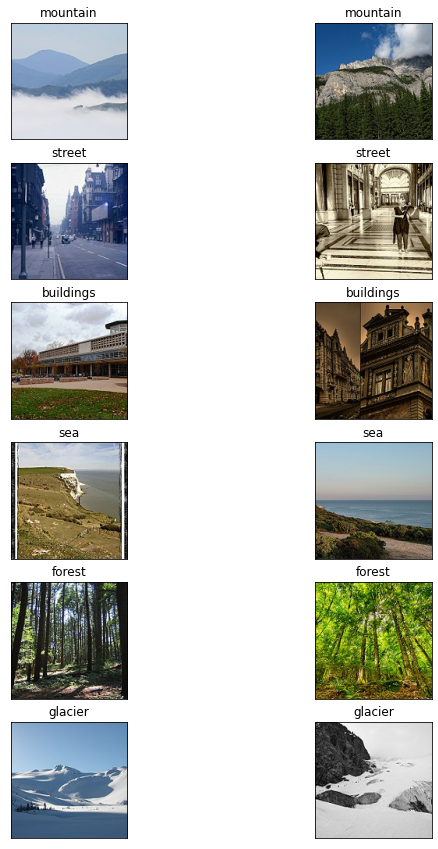

In [ ]:
plot_imgs()

### Model 1

In [ ]:
model = models.resnet101(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 6)

model = model.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[4,6], gamma=0.06)

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth


  0%|          | 0.00/171M [00:00<?, ?B/s]

In [ ]:
model_1, tn_loss_1, val_loss_1 = train_model(model, criterion, optimizer, scheduler)

Epoch 1/20
---------------
Training Loss: 0.518 
Validation Loss: 0.325
Validation loss decreased inf  --->  0.3249  
Saving model...

Epoch 2/20
---------------
Training Loss: 0.328 
Validation Loss: 0.309
Validation loss decreased 0.3249  --->  0.3092  
Saving model...

Epoch 3/20
---------------
Training Loss: 0.314 
Validation Loss: 0.289
Validation loss decreased 0.3092  --->  0.2888  
Saving model...

Epoch 4/20
---------------
Training Loss: 0.291 
Validation Loss: 0.310

Epoch 5/20
---------------
Training Loss: 0.264 
Validation Loss: 0.280
Validation loss decreased 0.2888  --->  0.2797  
Saving model...

Epoch 6/20
---------------
Training Loss: 0.258 
Validation Loss: 0.283

Epoch 7/20
---------------
Training Loss: 0.261 
Validation Loss: 0.276
Validation loss decreased 0.2797  --->  0.2761  
Saving model...

Epoch 8/20
---------------
Training Loss: 0.256 
Validation Loss: 0.271
Validation loss decreased 0.2761  --->  0.2706  
Saving model...

Epoch 9/20
---------------
Tr

In [ ]:
test_model(model_1)

Number of images Tested= 3000

Model Accuracy= 90.56666666666666


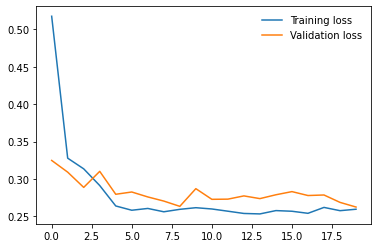

In [ ]:
loss_plot(tn_loss_1, val_loss_1)

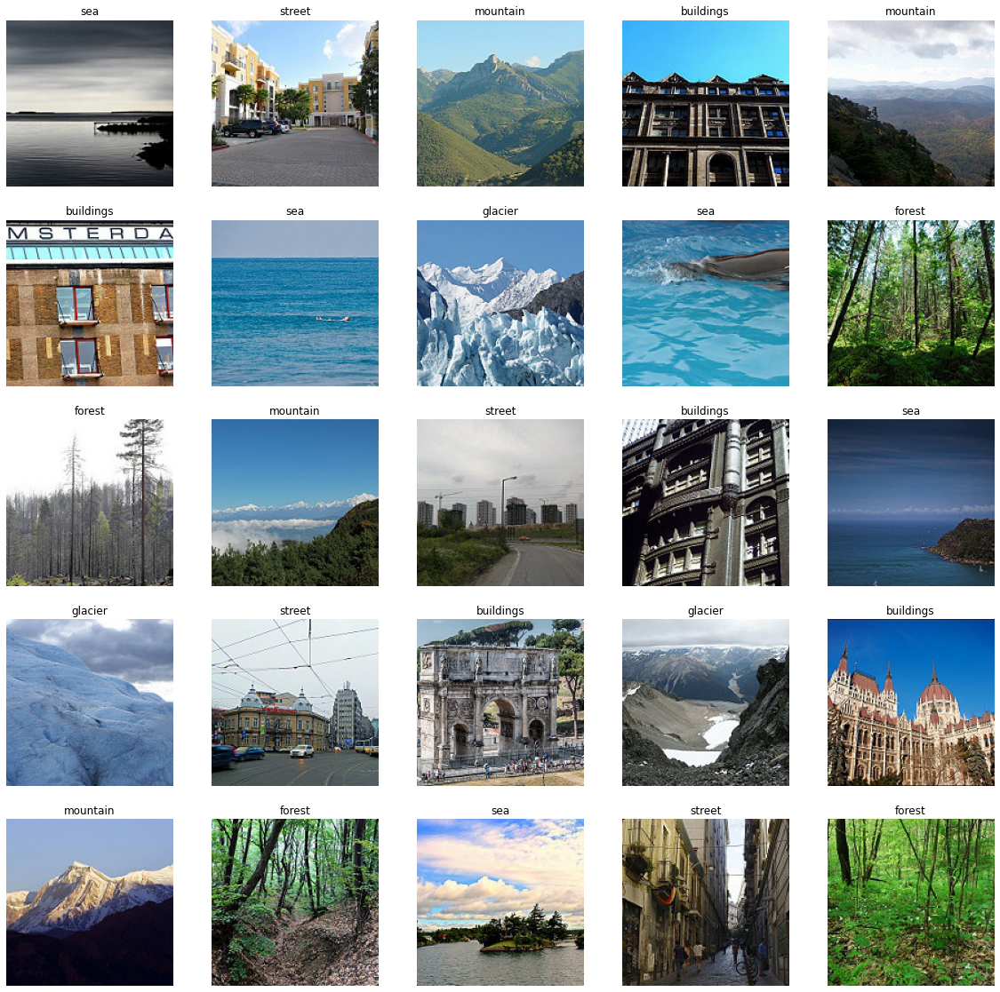

In [ ]:
predict(model_1)

### Model 2

In [ ]:
model = models.resnet101(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = nn.Sequential(nn.Dropout(p=0.2, inplace=True), nn.Linear(num_ftrs, 6))

model = model.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[4,6], gamma=0.06)

In [ ]:
model_2, tn_loss_2, val_loss_2 = train_model(model, criterion, optimizer, scheduler)

Epoch 1/20
---------------


/opt/conda/lib/python3.7/site-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Training Loss: 0.507 
Validation Loss: 0.334
Validation loss decreased inf  --->  0.3345  
Saving model...

Epoch 2/20
---------------
Training Loss: 0.338 
Validation Loss: 0.320
Validation loss decreased 0.3345  --->  0.3198  
Saving model...

Epoch 3/20
---------------
Training Loss: 0.332 
Validation Loss: 0.348

Epoch 4/20
---------------
Training Loss: 0.308 
Validation Loss: 0.282
Validation loss decreased 0.3198  --->  0.2820  
Saving model...

Epoch 5/20
---------------
Training Loss: 0.278 
Validation Loss: 0.276
Validation loss decreased 0.2820  --->  0.2759  
Saving model...

Epoch 6/20
---------------
Training Loss: 0.282 
Validation Loss: 0.283

Epoch 7/20
---------------
Training Loss: 0.282 
Validation Loss: 0.274
Validation loss decreased 0.2759  --->  0.2743  
Saving model...

Epoch 8/20
---------------
Training Loss: 0.275 
Validation Loss: 0.277

Epoch 9/20
---------------
Training Loss: 0.278 
Validation Loss: 0.269
Validation loss decreased 0.2743  --->  0.2686  


In [ ]:
test_model(model_2)

Number of images Tested= 3000

Model Accuracy= 90.33333333333333


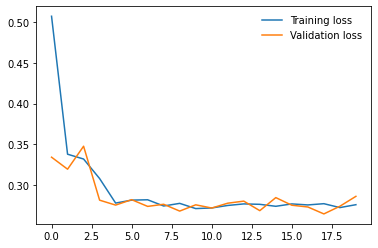

In [ ]:
loss_plot(tn_loss_2, val_loss_2)

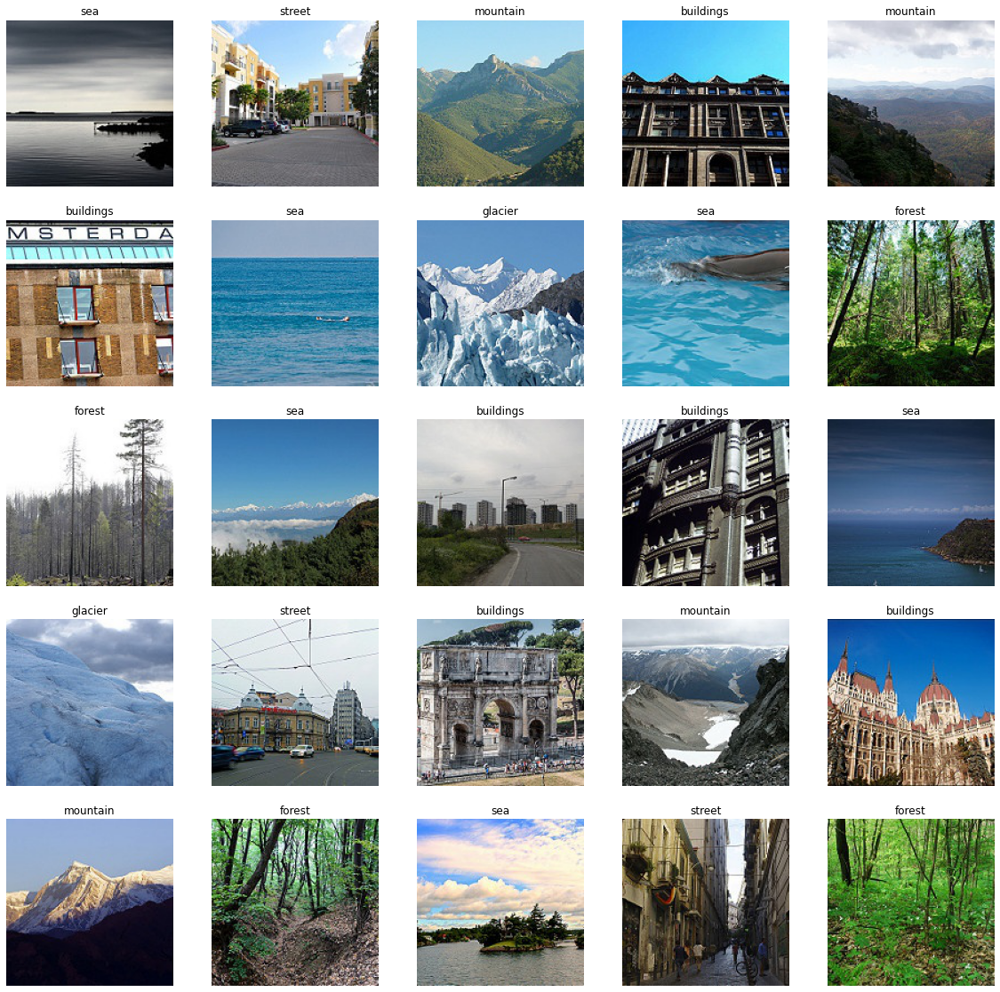

In [ ]:
predict(model_2)

### Model 3

In [ ]:
model = models.resnet101(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = nn.Sequential(nn.Linear(num_ftrs, 512), nn.ReLU(), nn.Dropout(0.2), nn.Linear(512, 6))

model = model.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[4,6], gamma=0.06)

In [ ]:
model_3, tn_loss_3, val_loss_3 = train_model(model, criterion, optimizer, scheduler)

Epoch 1/20
---------------
Training Loss: 0.454 
Validation Loss: 0.350
Validation loss decreased inf  --->  0.3495  
Saving model...

Epoch 2/20
---------------
Training Loss: 0.332 
Validation Loss: 0.276
Validation loss decreased 0.3495  --->  0.2764  
Saving model...

Epoch 3/20
---------------
Training Loss: 0.315 
Validation Loss: 0.306

Epoch 4/20
---------------
Training Loss: 0.309 
Validation Loss: 0.311

Epoch 5/20
---------------
Training Loss: 0.255 
Validation Loss: 0.267
Validation loss decreased 0.2764  --->  0.2673  
Saving model...

Epoch 6/20
---------------
Training Loss: 0.245 
Validation Loss: 0.269

Epoch 7/20
---------------
Training Loss: 0.243 
Validation Loss: 0.265
Validation loss decreased 0.2673  --->  0.2650  
Saving model...

Epoch 8/20
---------------
Training Loss: 0.236 
Validation Loss: 0.267

Epoch 9/20
---------------
Training Loss: 0.234 
Validation Loss: 0.262
Validation loss decreased 0.2650  --->  0.2624  
Saving model...

Epoch 10/20
---------

In [ ]:
test_model(model_3)

Number of images Tested= 3000

Model Accuracy= 91.13333333333333


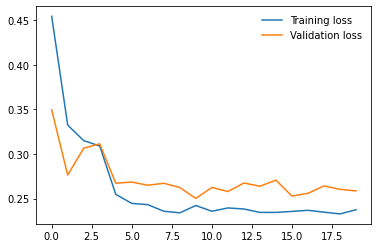

In [ ]:
loss_plot(tn_loss_3, val_loss_3)

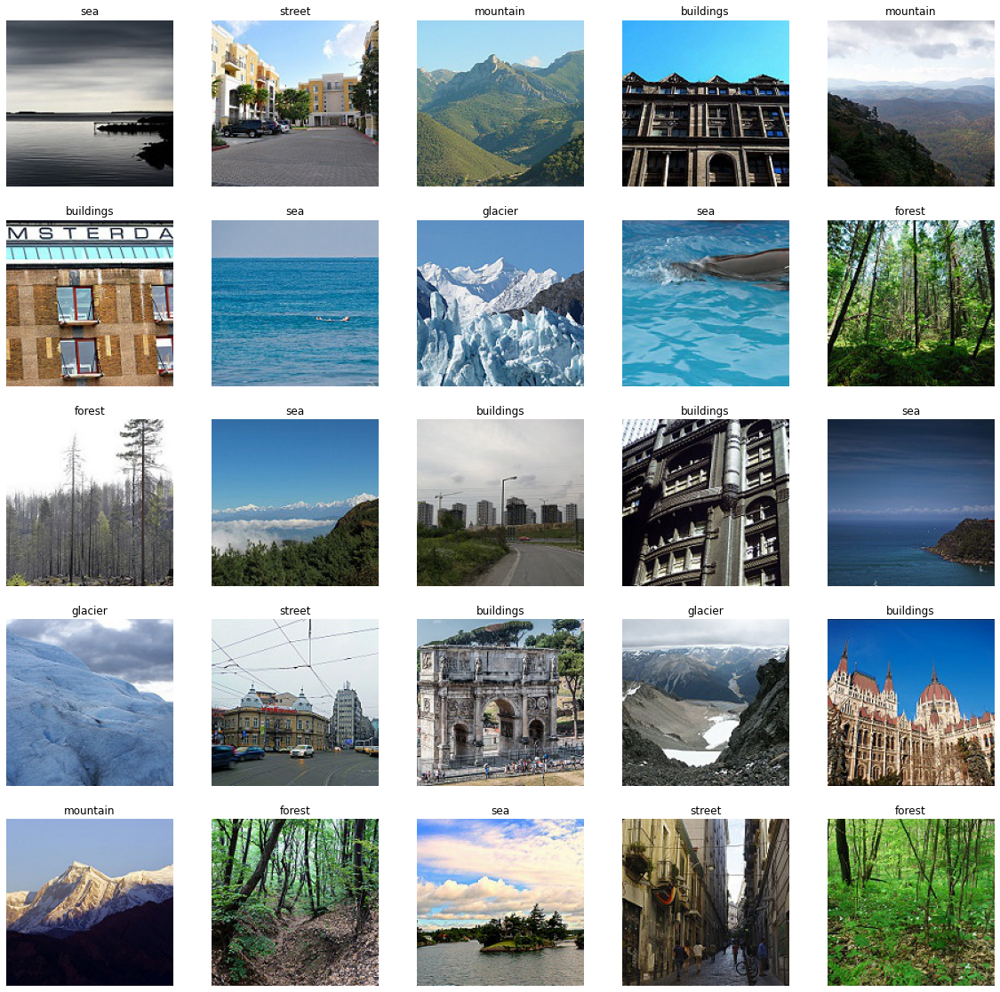

In [ ]:
predict(model_3)

### Model 4

In [ ]:
model = models.resnet152(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = nn.Sequential(nn.Linear(num_ftrs, 512),
                         nn.ReLU(),
                         nn.Dropout(0.2),
                         nn.Linear(512, 256),
                         nn.ReLU(),
                         nn.Linear(256, 6))

model = model.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[4,6], gamma=0.06)

In [ ]:
model_4, tn_loss_4, val_loss_4 = train_model(model, criterion, optimizer, scheduler)

Epoch 1/20
---------------
Training Loss: 0.494 
Validation Loss: 0.307
Validation loss decreased inf  --->  0.3074  
Saving model...

Epoch 2/20
---------------
Training Loss: 0.339 
Validation Loss: 0.373

Epoch 3/20
---------------
Training Loss: 0.321 
Validation Loss: 0.327

Epoch 4/20
---------------
Training Loss: 0.311 
Validation Loss: 0.323

Epoch 5/20
---------------
Training Loss: 0.260 
Validation Loss: 0.278
Validation loss decreased 0.3074  --->  0.2782  
Saving model...

Epoch 6/20
---------------
Training Loss: 0.247 
Validation Loss: 0.275
Validation loss decreased 0.2782  --->  0.2747  
Saving model...

Epoch 7/20
---------------
Training Loss: 0.244 
Validation Loss: 0.265
Validation loss decreased 0.2747  --->  0.2647  
Saving model...

Epoch 8/20
---------------
Training Loss: 0.240 
Validation Loss: 0.280

Epoch 9/20
---------------
Training Loss: 0.242 
Validation Loss: 0.273

Epoch 10/20
---------------
Training Loss: 0.239 
Validation Loss: 0.276

Epoch 11/20


In [ ]:
test_model(model_4)

Number of images Tested= 3000

Model Accuracy= 90.56666666666666


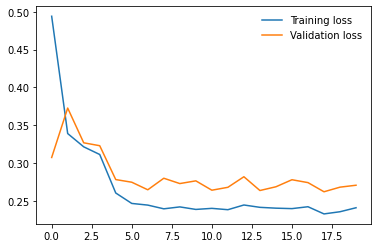

In [ ]:
loss_plot(tn_loss_4, val_loss_4)

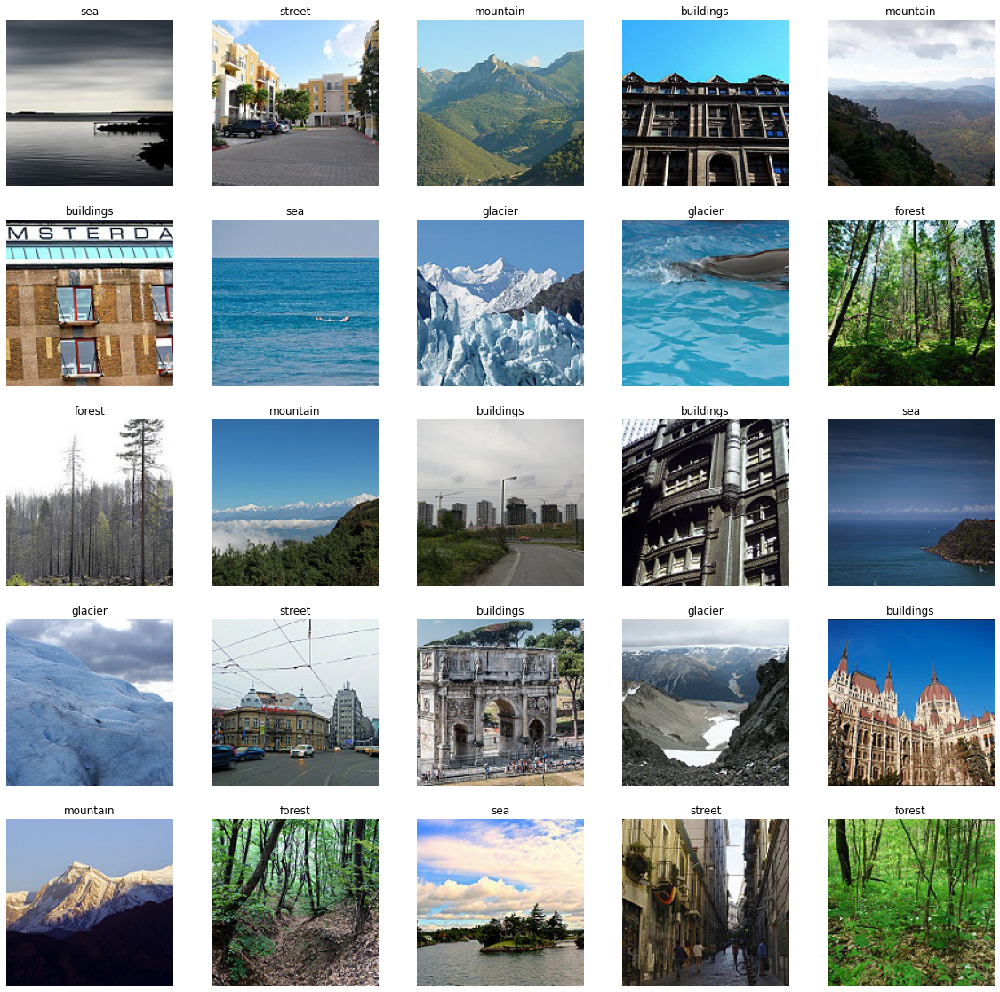

In [ ]:
predict(model_4)

### Model 5

In [ ]:
model = models.resnext101_32x8d(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = nn.Sequential(nn.Linear(num_ftrs, 512), nn.ReLU(), nn.Dropout(0.2), nn.Linear(512, 6))

model = model.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[4,6], gamma=0.06)

Downloading: "https://download.pytorch.org/models/resnext101_32x8d-8ba56ff5.pth" to /root/.cache/torch/hub/checkpoints/resnext101_32x8d-8ba56ff5.pth


  0%|          | 0.00/340M [00:00<?, ?B/s]

In [ ]:
model_5, tn_loss_5, val_loss_5 = train_model(model, criterion, optimizer, scheduler)

Epoch 1/20
---------------
Training Loss: 0.432 
Validation Loss: 0.275
Validation loss decreased inf  --->  0.2747  
Saving model...

Epoch 2/20
---------------
Training Loss: 0.315 
Validation Loss: 0.282

Epoch 3/20
---------------
Training Loss: 0.272 
Validation Loss: 0.273
Validation loss decreased 0.2747  --->  0.2731  
Saving model...

Epoch 4/20
---------------
Training Loss: 0.257 
Validation Loss: 0.269
Validation loss decreased 0.2731  --->  0.2687  
Saving model...

Epoch 5/20
---------------
Training Loss: 0.213 
Validation Loss: 0.243
Validation loss decreased 0.2687  --->  0.2430  
Saving model...

Epoch 6/20
---------------
Training Loss: 0.210 
Validation Loss: 0.253

Epoch 7/20
---------------
Training Loss: 0.207 
Validation Loss: 0.247

Epoch 8/20
---------------
Training Loss: 0.199 
Validation Loss: 0.246

Epoch 9/20
---------------
Training Loss: 0.201 
Validation Loss: 0.251

Epoch 10/20
---------------
Training Loss: 0.204 
Validation Loss: 0.252

Epoch 11/20


In [ ]:
test_model(model_5)

Number of images Tested= 3000

Model Accuracy= 91.36666666666666


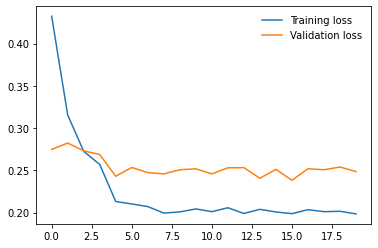

In [ ]:
loss_plot(tn_loss_5, val_loss_5)

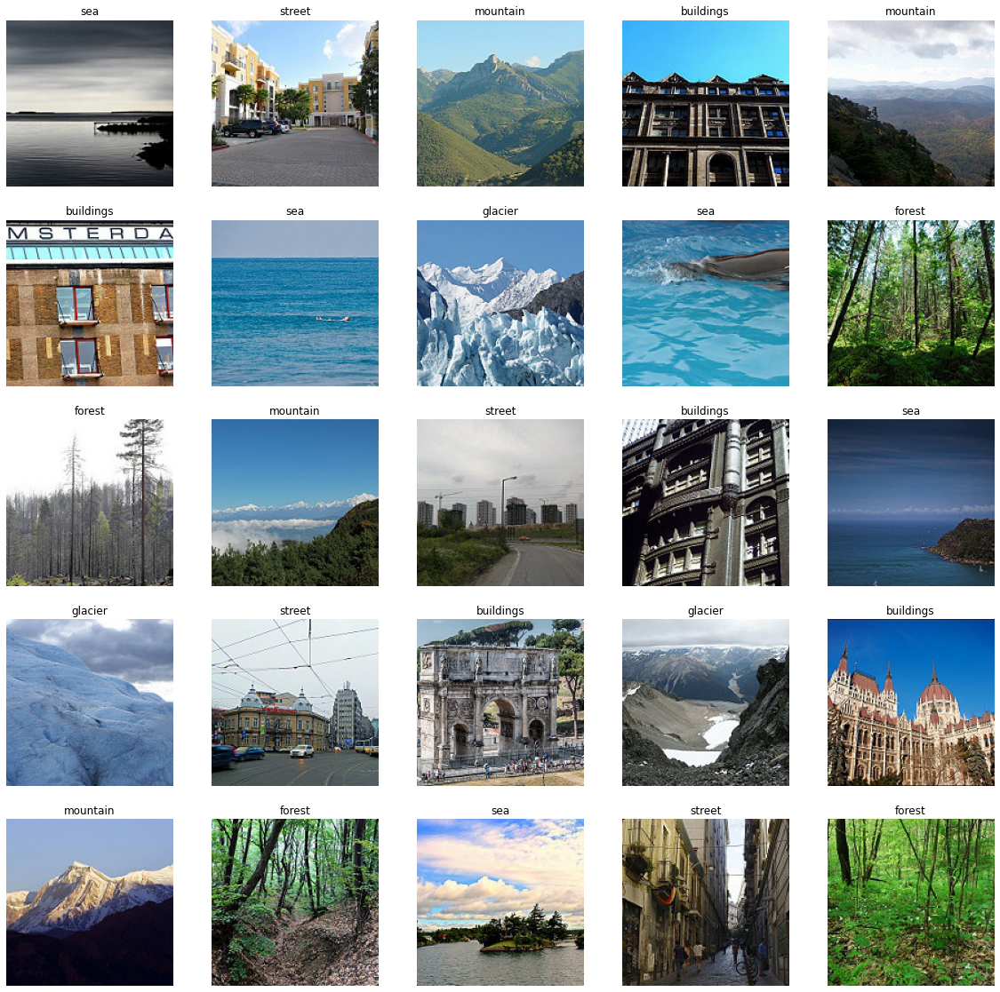

In [ ]:
predict(model_5)

### Model 6

In [ ]:
model = models.vgg19(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.classifier[-1].in_features
model.classifier[-1] = nn.Sequential(
                         nn.Linear(num_ftrs, 512),
                         nn.ReLU(),
                         nn.Dropout(0.2),
                         nn.Linear(512, 256),
                         nn.ReLU(),
                         nn.Linear(256, 6))

model = model.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[4,6], gamma=0.06)

In [ ]:
model_6, tn_loss_6, val_loss_6 = train_model(model, criterion, optimizer, scheduler)

Epoch 1/20
---------------
Training Loss: 0.414 
Validation Loss: 0.283
Validation loss decreased inf  --->  0.2831  
Saving model...

Epoch 2/20
---------------
Training Loss: 0.324 
Validation Loss: 0.278
Validation loss decreased 0.2831  --->  0.2782  
Saving model...

Epoch 3/20
---------------
Training Loss: 0.304 
Validation Loss: 0.264
Validation loss decreased 0.2782  --->  0.2638  
Saving model...

Epoch 4/20
---------------
Training Loss: 0.283 
Validation Loss: 0.258
Validation loss decreased 0.2638  --->  0.2584  
Saving model...

Epoch 5/20
---------------
Training Loss: 0.260 
Validation Loss: 0.245
Validation loss decreased 0.2584  --->  0.2449  
Saving model...

Epoch 6/20
---------------
Training Loss: 0.248 
Validation Loss: 0.249

Epoch 7/20
---------------
Training Loss: 0.250 
Validation Loss: 0.245
Validation loss decreased 0.2449  --->  0.2445  
Saving model...

Epoch 8/20
---------------
Training Loss: 0.251 
Validation Loss: 0.244
Validation loss decreased 0.24

In [ ]:
test_model(model_6)

Number of images Tested= 3000

Model Accuracy= 90.7


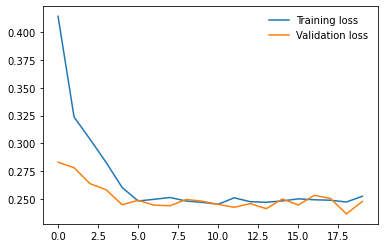

In [ ]:
loss_plot(tn_loss_6, val_loss_6)

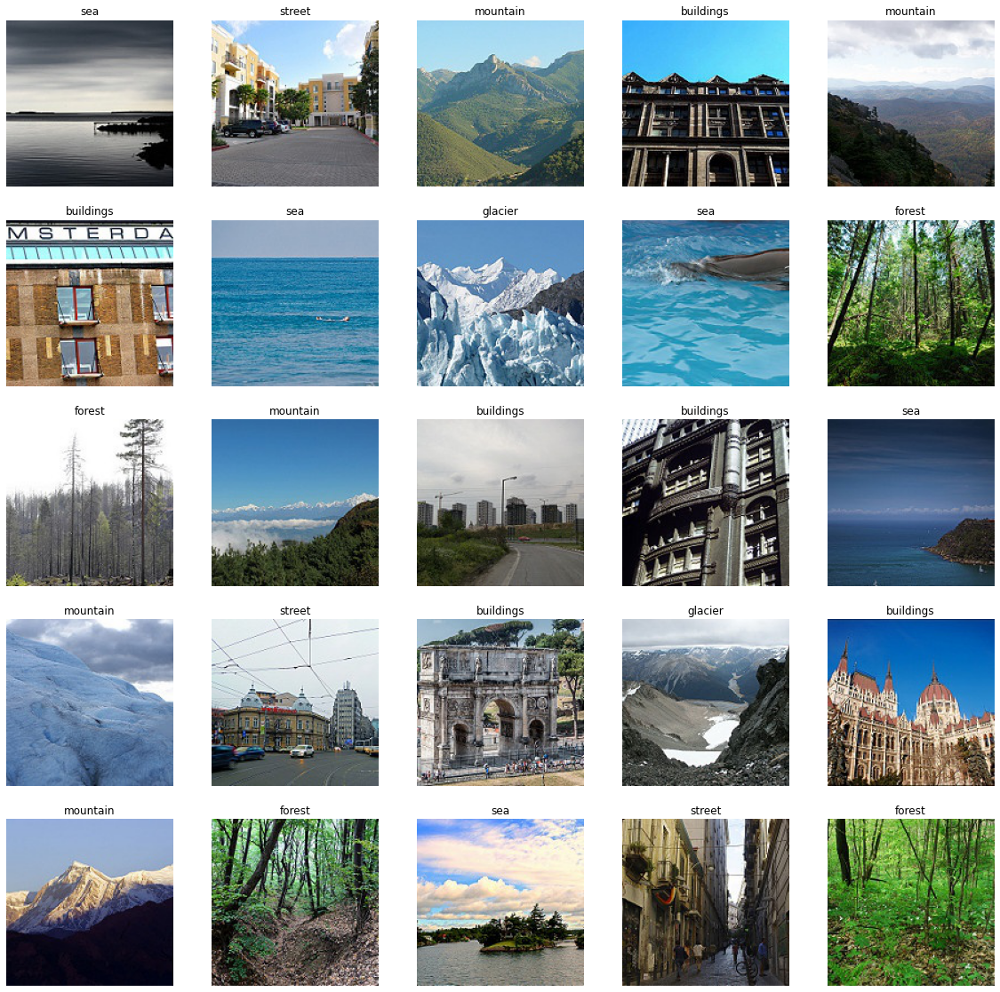

In [ ]:
predict(model_6)

### Model 7

In [ ]:
model = models.densenet161(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.classifier.in_features
model.classifier = nn.Sequential(
                         nn.Linear(num_ftrs, 512),
                         nn.ReLU(),
                         nn.Dropout(0.2),
                         nn.Linear(512, 256),
                         nn.ReLU(),
                         nn.Linear(256, 6))

model = model.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[4,6], gamma=0.06)

In [ ]:
model_7, tn_loss_7, val_loss_7 = train_model(model, criterion, optimizer, scheduler)

Epoch 1/20
---------------
Training Loss: 0.440 
Validation Loss: 0.298
Validation loss decreased inf  --->  0.2981  
Saving model...

Epoch 2/20
---------------
Training Loss: 0.306 
Validation Loss: 0.324

Epoch 3/20
---------------
Training Loss: 0.268 
Validation Loss: 0.271
Validation loss decreased 0.2981  --->  0.2713  
Saving model...

Epoch 4/20
---------------
Training Loss: 0.238 
Validation Loss: 0.266
Validation loss decreased 0.2713  --->  0.2662  
Saving model...

Epoch 5/20
---------------
Training Loss: 0.193 
Validation Loss: 0.240
Validation loss decreased 0.2662  --->  0.2399  
Saving model...

Epoch 6/20
---------------
Training Loss: 0.188 
Validation Loss: 0.238
Validation loss decreased 0.2399  --->  0.2379  
Saving model...

Epoch 7/20
---------------
Training Loss: 0.178 
Validation Loss: 0.237
Validation loss decreased 0.2379  --->  0.2371  
Saving model...

Epoch 8/20
---------------
Training Loss: 0.182 
Validation Loss: 0.245

Epoch 9/20
---------------
Tr

In [ ]:
test_model(model_7)

Number of images Tested= 3000

Model Accuracy= 91.53333333333333


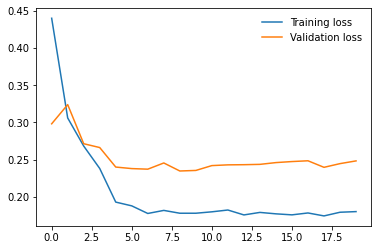

In [ ]:
loss_plot(tn_loss_7, val_loss_7)

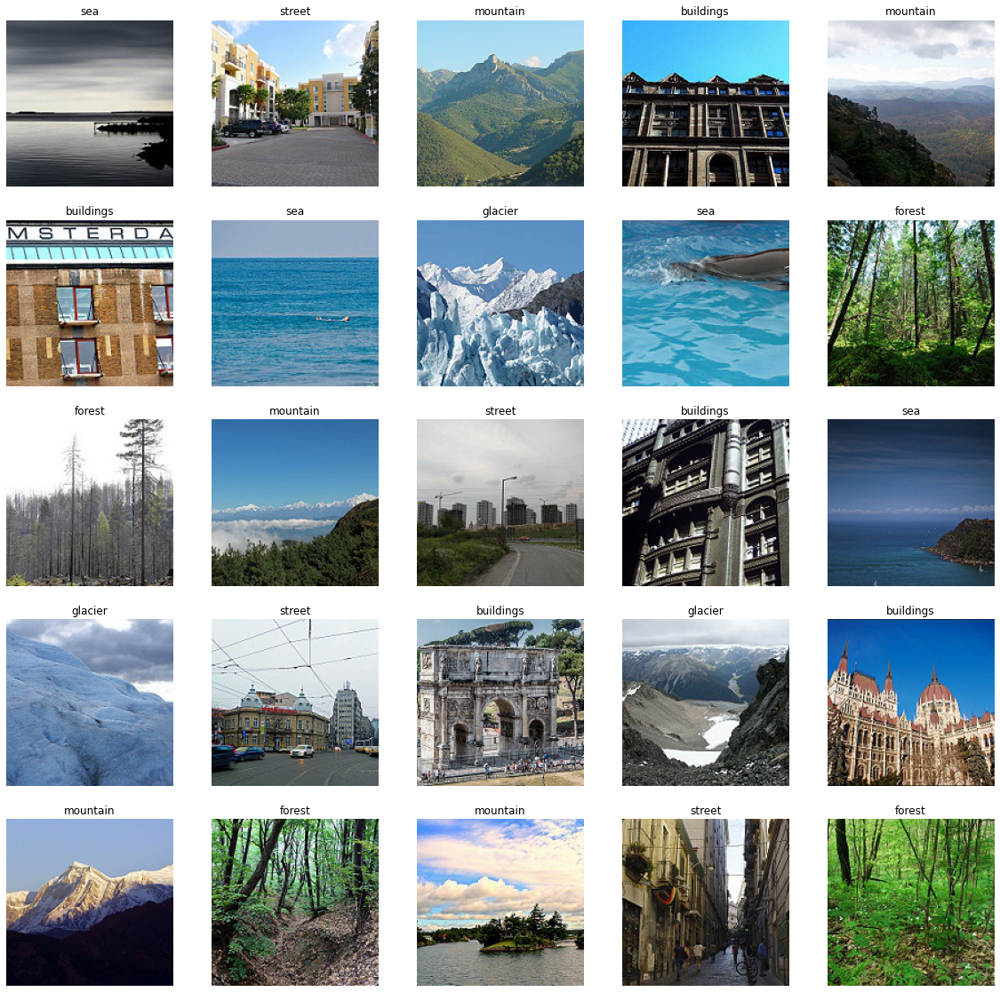

In [ ]:
predict(model_7)

### Model 8

In [ ]:
model = models.densenet161(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.classifier.in_features

model.classifier = nn.Sequential(
    nn.Linear(num_ftrs, 1024),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(1024, 512),
    nn.ReLU(),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Linear(256, 6),
)

model = model.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[4,6], gamma=0.06)

In [ ]:
model_8, tn_loss_8, val_loss_8 = train_model(model, criterion, optimizer, scheduler)

Epoch 1/20
---------------
Training Loss: 0.172 
Validation Loss: 0.254
Validation loss decreased inf  --->  0.2541  
Saving model...

Epoch 2/20
---------------
Training Loss: 0.168 
Validation Loss: 0.264

Epoch 3/20
---------------
Training Loss: 0.175 
Validation Loss: 0.262

Epoch 4/20
---------------
Training Loss: 0.167 
Validation Loss: 0.258

Epoch 5/20
---------------
Training Loss: 0.172 
Validation Loss: 0.245
Validation loss decreased 0.2541  --->  0.2452  
Saving model...

Epoch 6/20
---------------
Training Loss: 0.167 
Validation Loss: 0.248

Epoch 7/20
---------------
Training Loss: 0.173 
Validation Loss: 0.250

Epoch 8/20
---------------
Training Loss: 0.167 
Validation Loss: 0.254

Epoch 9/20
---------------
Training Loss: 0.166 
Validation Loss: 0.258

Epoch 10/20
---------------
Training Loss: 0.170 
Validation Loss: 0.256

Epoch 11/20
---------------
Training Loss: 0.163 
Validation Loss: 0.247

Epoch 12/20
---------------
Training Loss: 0.170 
Validation Loss: 0

In [ ]:
test_model(model_8)

Number of images Tested= 3000

Model Accuracy= 91.5


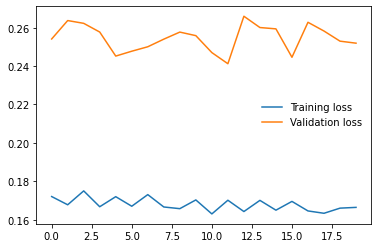

In [ ]:
loss_plot(tn_loss_8, val_loss_8)

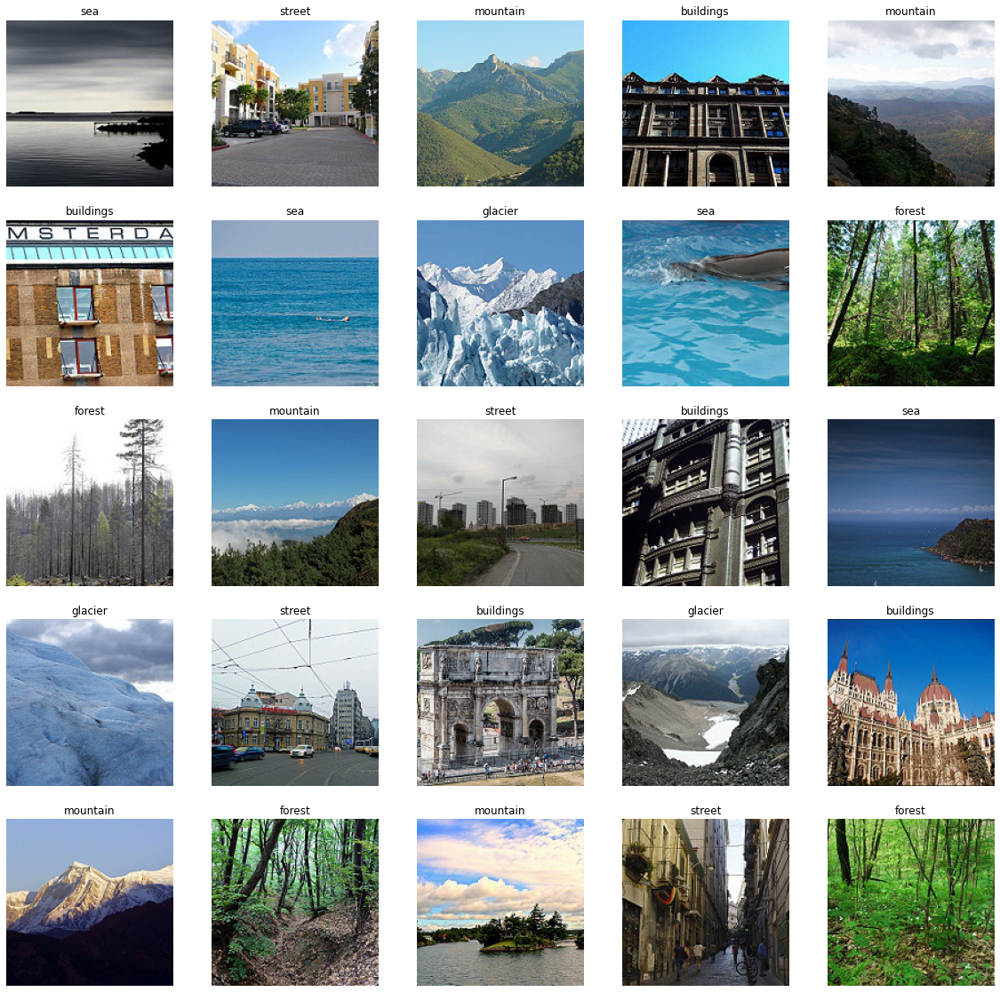

In [ ]:
predict(model_8)

### Comparison


<pre>

Base model         Layers                               Accuracy  
...................................................................
resnet101          Linear(num_ftrs, 6)                  90.56%

resnet101          Dropout(p=0.2, inplace=True)         90.33%
                   Linear(num_ftrs, 6)

resnet101          Linear(num_ftrs, 512)                91.13%
                   ReLU()
                   Dropout(0.2)
                   Linear(512, 6)

resnet152          Linear(num_ftrs, 512)                90.56%
                   ReLU()
                   Dropout(0.2)
                   Linear(512, 256)
                   ReLU()
                   Linear(256, 6)
        
resnext101_32x8d   Linear(num_ftrs, 512)                91.26%
                   ReLU()
                   Dropout(0.2)
                   Linear(512, 6)

vgg19              Linear(num_ftrs, 512)                90.7%
                   ReLU()
                   Dropout(0.2)
                   Linear(512, 256)  
                   ReLU()
                   Linear(256, 6)

densenet161        Linear(num_ftrs, 512)                91.56%
                   ReLU()
                   Dropout(0.2)
                   Linear(512, 256)
                   ReLU()
                   Linear(256, 6)

densenet161        Linear(num_ftrs, 1024)               91.5%
                   ReLU()
                   Dropout(0.2)
                   Linear(1024, 512)
                   ReLU()
                   Linear(512, 256)
                   ReLU()
                   Linear(256, 6)
</pre>